# Analysis of 3k T cells from cancer

In [1]:
%load_ext autoreload
%autoreload 2
import sys

sys.path.append("../..") 
import scirpy as ir
import pandas as pd
import numpy as np
import scanpy as sc
from matplotlib import pyplot as plt

/opt/hostedtoolcache/Python/3.7.6/x64/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [2]:
sc.logging.print_versions()

scanpy==1.4.6 anndata==0.7.1 umap==0.4.1 numpy==1.18.3 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.2


In [3]:
adata = ir.datasets.wu2020_3k()

wu2020_3k.h5ad: 0.00B [00:00, ?B/s]

wu2020_3k.h5ad:   0%|          | 8.19k/28.7M [00:00<14:57, 32.0kB/s]

wu2020_3k.h5ad:  33%|███▎      | 9.36M/28.7M [00:00<07:03, 45.7kB/s]

wu2020_3k.h5ad:  54%|█████▍    | 15.5M/28.7M [00:00<03:22, 65.2kB/s]

wu2020_3k.h5ad:  77%|███████▋  | 22.2M/28.7M [00:00<01:09, 93.1kB/s]

wu2020_3k.h5ad: 28.7MB [00:00, 43.3MB/s]                            

In [4]:
adata.shape

(3000, 30727)

It just has additional TCR-related columns in `obs`:

 * `has_tcr`: `True` for all cells with a T-cell receptor
 * `TRA_1_<attr>`/`TRA_2_<attr>`: columns related to the primary and secondary TCR-alpha chain
 * `TRB_1_<attr>`/`TRB_2_<attr>`: columns related to the primary and secondary TCR-beta chain

The list of attributes available are:

 * `c_gene`, `v_gene`, `d_gene`, `j_gene`: The gene symbols of the respective genes
 * `cdr3` and `cdr3_nt`: The amino acoid and nucleotide sequences of the CDR3 regions
 * `junction_ins`: The number of nucleotides inserted in the `VD`/`DJ`/`VJ` junctions. 

In [5]:
adata.obs

,TRA_1_c_gene,TRA_1_cdr3,TRA_1_cdr3_nt,TRA_1_d_gene,TRA_1_expr,TRA_1_j_gene,TRA_1_junction_ins,TRA_1_v_gene,TRA_2_c_gene,TRA_2_cdr3,...,TRB_2_junction_ins,TRB_2_v_gene,batch,clonotype_orig,cluster_orig,has_tcr,multi_chain,patient,sample,source
LN1_GTAGGCCAGCGTAGTG-1-19,None,None,None,None,NaN,None,None,None,None,None,...,None,TRBV12-3,19,lung1.tn.C223,4.4-FOS,True,False,Lung1,LN1,NAT
RN2_AGAGCGACAGATTGCT-1-27,TRAC,CAVRGNNNARLMF,TGTGCTGTGAGGGGGAATAACAATGCCAGACTCATGTTT,None,1.0,TRAJ31,None,TRAV8-6,None,None,...,None,None,27,renal2.tnb.C1362,4.4-FOS,True,False,Renal2,RN2,NAT
LN1_GTCATTTCAATGAAAC-1-19,TRAC,CAVRLGNQFYF,TGTGCTGTGAGGTTGGGTAACCAGTTCTATTTT,None,2.0,TRAJ49,None,TRAV21,None,None,...,None,None,19,lung1.tn.C25,8.2-Tem,True,False,Lung1,LN1,NAT
LN2_GACACGCAGGTAGCTG-2-2,None,None,None,None,NaN,None,None,None,None,None,...,None,None,2,lung2.tn.C2452,8.6-KLRB1,True,False,Lung2,LN2,NAT
LN2_GCACTCTCAGGGATTG-2-2,TRAC,CAASDPTVEAGTALIF,TGTGCAGCAAGCGACCCCACGGTCGAGGCAGGAACTGCTCTGATCTTT,None,4.0,TRAJ15,None,TRAV23DV6,None,None,...,None,None,2,lung2.tn.C5631,4.4-FOS,True,False,Lung2,LN2,NAT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RT3_GCAGTTAGTATGAAAC-1-6,TRAC,CAAMDSNYQLIW,TGTGCTGCGATGGATAGCAACTATCAGTTAATCTGG,None,1.0,TRAJ33,None,TRAV1-2,None,None,...,None,None,6,renal3.tnb.C176,4.2-RPL32,True,False,Renal3,RT3,Tumor
LT1_GACGTGCTCTCAAGTG-1-24,TRAC,CAYRSSLGGATNKLIF,TGTGCTTATAGGAGTTCCCTTGGTGGTGCTACAAACAAGCTCATCTTT,None,1.0,TRAJ32,None,TRAV38-2DV8,None,None,...,None,None,24,lung1.tn.C151,8.2-Tem,True,False,Lung1,LT1,Tumor
ET3_GCTGGGTAGACCTTTG-1-3,None,None,None,None,NaN,None,None,None,None,None,...,None,None,3,endo3.tn.C76,3.1-MT,True,False,Endo3,ET3,Tumor
RT1_TAAGAGATCCTTAATC-1-8,TRAC,CAMSEISGGYNKLIF,TGTGCAATGAGCGAGATTTCTGGTGGCTACAATAAGCTGATTTTT,None,5.0,TRAJ4,None,TRAV12-3,None,None,...,None,None,8,renal1.tnb.C83,4.5-IL6ST,True,False,Renal1,RT1,Tumor


## Preprocess Transcriptomics data

Transcriptomics data needs to be filtered and preprocessed as with any other single-cell dataset.
We recommend following the [scanpy tutorial](https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html)
and the best practice paper by [Luecken et al.](https://www.embopress.org/doi/10.15252/msb.20188746)

In [6]:
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.filter_cells(adata, min_genes=100)

In [7]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1000)
sc.pp.log1p(adata)

For the _Wu2020_ dataset, the authors already provide clusters and UMAP coordinates.
Instead of performing clustering and cluster annotation ourselves, we will just use
provided data.

In [8]:
adata.obsm["X_umap"] = adata.obsm["X_umap_orig"]

In [9]:
mapping = {
    "3.1-MT": "other",
    "4.1-Trm": "CD4_Trm",
    "4.2-RPL32": "CD4_RPL32",
    "4.3-TCF7": "CD4_TCF7",
    "4.4-FOS": "CD4_FOSS",
    "4.5-IL6ST": "CD4_IL6ST",
    "4.6a-Treg": "CD4_Treg",
    "4.6b-Treg": "CD4_Treg",
    "8.1-Teff": "CD8_Teff",
    "8.2-Tem": "CD8_Tem",
    "8.3a-Trm": "CD8_Trm",
    "8.3b-Trm": "CD8_Trm",
    "8.3c-Trm": "CD8_Trm",
    "8.4-Chrom": "other",
    "8.5-Mitosis": "other",
    "8.6-KLRB1": "other",
}
adata.obs["cluster"] = [mapping[x] for x in adata.obs["cluster_orig"]]

Let's inspect the UMAP plots. The first three panels show the UMAP plot colored by sample, patient and cluster.
We don't observe any clustering of samples or patients that could hint at batch effects.

The lower three panels show the UMAP colored by the T cell markers _CD8_, _CD4_, and _FOXP3_.
We can confirm that the markers correspond to their respective cluster labels.

In [10]:
sc.pl.umap(adata, color=["sample", "patient", "cluster", "CD8A", "CD4", "FOXP3"], ncols=2, wspace=.5)

... storing 'cluster' as categorical


## TCR Quality Control

In [11]:
ir.tl.chain_pairing(adata)

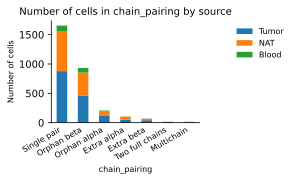

In [12]:
ir.pl.group_abundance(
    adata, groupby="chain_pairing", target_col="source",
)

Indeed, in this dataset, ~6% of cells have more than a one pair of productive T-cell receptors:

In [13]:
print("Fraction of cells with more than one pair of TCRs: {:.2f}".format(
    np.sum(adata.obs["chain_pairing"].isin(["Extra beta", "Extra alpha", "Two full chains"])) / adata.n_obs
))

Fraction of cells with more than one pair of TCRs: 0.06


Next, we visualize the _Multichain_ cells on the UMAP plot and exclude them from downstream analysis:

... storing 'chain_pairing' as categorical


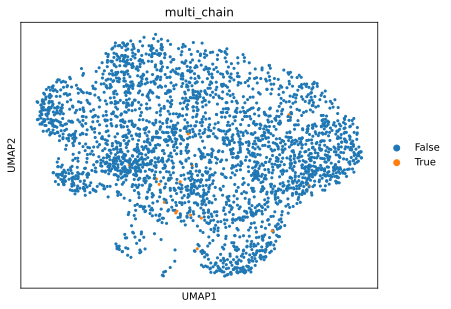

In [14]:
sc.pl.umap(adata, color="multi_chain")

In [15]:
adata = adata[adata.obs["multi_chain"] != "True", :].copy()

## Define clonotypes

### Compute CDR3 neighborhood graph

In [16]:
ir.pp.tcr_neighbors(adata, receptor_arms="all", dual_tcr="primary_only", cutoff=0)
ir.tl.define_clonotypes(adata)

... storing 'clonotype' as categorical


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f11085addd0>],
      dtype=object)

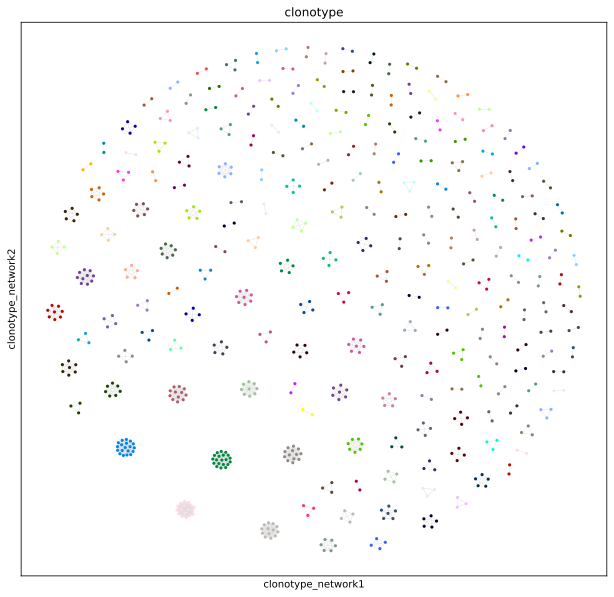

In [17]:
ir.tl.clonotype_network(adata, min_size=2)
ir.pl.clonotype_network(adata, color="clonotype", legend_loc="none")

Let's re-compute the network with a `cutoff` of `10`.
That's the equivalent of 2 `R`s mutating into `N` (using the BLOSUM62 distance matrix).

In [18]:
sc.settings.verbosity = 4

In [19]:
ir.pp.tcr_neighbors(adata, cutoff=10, receptor_arms="all", dual_tcr="all")
ir.tl.define_clonotypes(adata, partitions="connected")

    Finished initalizing TcrNeighbors object. 


  0%|          | 0/1698 [00:00<?, ?it/s]

  0%|          | 5/1698 [00:00<00:42, 39.83it/s]

  1%|          | 10/1698 [00:00<00:40, 41.70it/s]

  1%|          | 15/1698 [00:00<00:38, 43.40it/s]

  1%|          | 20/1698 [00:00<00:37, 44.18it/s]

  2%|▏         | 26/1698 [00:00<00:36, 45.58it/s]

  2%|▏         | 32/1698 [00:00<00:35, 46.60it/s]

  2%|▏         | 37/1698 [00:00<00:35, 47.26it/s]

  3%|▎         | 43/1698 [00:00<00:34, 48.48it/s]

  3%|▎         | 49/1698 [00:01<00:33, 49.28it/s]

  3%|▎         | 55/1698 [00:01<00:33, 48.86it/s]

  4%|▎         | 61/1698 [00:01<00:33, 49.53it/s]

  4%|▍         | 67/1698 [00:01<00:32, 49.79it/s]

  4%|▍         | 73/1698 [00:01<00:33, 49.07it/s]

  5%|▍         | 78/1698 [00:01<00:32, 49.31it/s]

  5%|▍         | 83/1698 [00:01<00:35, 45.99it/s]

  5%|▌         | 89/1698 [00:01<00:34, 46.82it/s]

  6%|▌         | 95/1698 [00:01<00:32, 48.78it/s]

  6%|▌         | 101/1698 [00:02<00:31, 50.03it/s]

  6%|▋         | 107/1698 [00:02<00:31, 50.21it/s]

  7%|▋         | 113/1698 [00:02<00:30, 51.37it/s]

  7%|▋         | 119/1698 [00:02<00:31, 50.72it/s]

  7%|▋         | 125/1698 [00:02<00:30, 51.30it/s]

  8%|▊         | 131/1698 [00:02<00:30, 50.90it/s]

  8%|▊         | 137/1698 [00:02<00:30, 51.88it/s]

  8%|▊         | 143/1698 [00:02<00:29, 51.89it/s]

  9%|▉         | 149/1698 [00:03<00:29, 53.21it/s]

  9%|▉         | 155/1698 [00:03<00:28, 54.06it/s]

  9%|▉         | 161/1698 [00:03<00:28, 53.42it/s]

 10%|▉         | 167/1698 [00:03<00:28, 52.93it/s]

 10%|█         | 173/1698 [00:03<00:28, 53.75it/s]

 11%|█         | 179/1698 [00:03<00:28, 53.20it/s]

 11%|█         | 185/1698 [00:03<00:28, 52.92it/s]

 11%|█         | 191/1698 [00:03<00:28, 53.64it/s]

 12%|█▏        | 197/1698 [00:03<00:27, 53.94it/s]

 12%|█▏        | 203/1698 [00:04<00:27, 54.03it/s]

 12%|█▏        | 209/1698 [00:04<00:27, 55.05it/s]

 13%|█▎        | 215/1698 [00:04<00:27, 54.05it/s]

 13%|█▎        | 221/1698 [00:04<00:26, 55.10it/s]

 13%|█▎        | 227/1698 [00:04<00:26, 55.20it/s]

 14%|█▎        | 233/1698 [00:04<00:26, 54.96it/s]

 14%|█▍        | 239/1698 [00:04<00:26, 55.31it/s]

 14%|█▍        | 245/1698 [00:04<00:26, 55.45it/s]

 15%|█▍        | 251/1698 [00:04<00:26, 54.46it/s]

 15%|█▌        | 257/1698 [00:04<00:26, 55.02it/s]

 15%|█▌        | 263/1698 [00:05<00:25, 56.07it/s]

 16%|█▌        | 269/1698 [00:05<00:25, 56.22it/s]

 16%|█▌        | 275/1698 [00:05<00:25, 55.55it/s]

 17%|█▋        | 282/1698 [00:05<00:24, 57.42it/s]

 17%|█▋        | 288/1698 [00:05<00:25, 56.02it/s]

 17%|█▋        | 294/1698 [00:05<00:25, 55.77it/s]

 18%|█▊        | 300/1698 [00:05<00:25, 55.38it/s]

 18%|█▊        | 306/1698 [00:05<00:25, 55.32it/s]

 18%|█▊        | 312/1698 [00:05<00:25, 54.88it/s]

 19%|█▊        | 318/1698 [00:06<00:24, 55.58it/s]

 19%|█▉        | 324/1698 [00:06<00:24, 55.79it/s]

 19%|█▉        | 330/1698 [00:06<00:25, 53.67it/s]

 20%|█▉        | 336/1698 [00:06<00:25, 53.78it/s]

 20%|██        | 342/1698 [00:06<00:24, 54.41it/s]

 20%|██        | 348/1698 [00:06<00:24, 55.12it/s]

 21%|██        | 354/1698 [00:06<00:24, 54.52it/s]

 21%|██        | 360/1698 [00:06<00:24, 55.28it/s]

 22%|██▏       | 366/1698 [00:06<00:24, 55.46it/s]

 22%|██▏       | 373/1698 [00:07<00:22, 57.65it/s]

 22%|██▏       | 379/1698 [00:07<00:23, 56.85it/s]

 23%|██▎       | 385/1698 [00:07<00:23, 56.20it/s]

 23%|██▎       | 391/1698 [00:07<00:22, 57.24it/s]

 23%|██▎       | 398/1698 [00:07<00:21, 59.81it/s]

 24%|██▍       | 405/1698 [00:07<00:21, 60.25it/s]

 24%|██▍       | 412/1698 [00:07<00:20, 62.16it/s]

 25%|██▍       | 419/1698 [00:07<00:21, 60.34it/s]

 25%|██▌       | 427/1698 [00:07<00:20, 61.94it/s]

 26%|██▌       | 435/1698 [00:08<00:19, 63.63it/s]

 26%|██▌       | 442/1698 [00:08<00:19, 65.36it/s]

 26%|██▋       | 449/1698 [00:08<00:19, 63.24it/s]

 27%|██▋       | 456/1698 [00:08<00:19, 63.23it/s]

 27%|██▋       | 463/1698 [00:08<00:19, 63.29it/s]

 28%|██▊       | 470/1698 [00:08<00:19, 61.68it/s]

 28%|██▊       | 477/1698 [00:08<00:19, 62.76it/s]

 29%|██▊       | 484/1698 [00:08<00:20, 59.09it/s]

 29%|██▉       | 491/1698 [00:08<00:19, 61.28it/s]

 29%|██▉       | 498/1698 [00:09<00:19, 61.93it/s]

 30%|██▉       | 505/1698 [00:09<00:19, 60.58it/s]

 30%|███       | 512/1698 [00:09<00:19, 62.30it/s]

 31%|███       | 519/1698 [00:09<00:18, 63.03it/s]

 31%|███       | 526/1698 [00:09<00:18, 64.83it/s]

 31%|███▏      | 534/1698 [00:09<00:17, 65.68it/s]

 32%|███▏      | 542/1698 [00:09<00:17, 65.44it/s]

 32%|███▏      | 550/1698 [00:09<00:17, 66.20it/s]

 33%|███▎      | 557/1698 [00:09<00:17, 65.31it/s]

 33%|███▎      | 564/1698 [00:10<00:17, 66.60it/s]

 34%|███▎      | 571/1698 [00:10<00:16, 66.69it/s]

 34%|███▍      | 578/1698 [00:10<00:16, 66.96it/s]

 34%|███▍      | 585/1698 [00:10<00:16, 66.04it/s]

 35%|███▍      | 593/1698 [00:10<00:16, 67.65it/s]

 35%|███▌      | 601/1698 [00:10<00:15, 69.01it/s]

 36%|███▌      | 609/1698 [00:10<00:15, 70.72it/s]

 36%|███▋      | 617/1698 [00:10<00:15, 69.80it/s]

 37%|███▋      | 625/1698 [00:10<00:14, 72.04it/s]

 37%|███▋      | 633/1698 [00:11<00:14, 74.08it/s]

 38%|███▊      | 642/1698 [00:11<00:14, 75.04it/s]

 38%|███▊      | 650/1698 [00:11<00:14, 73.95it/s]

 39%|███▉      | 658/1698 [00:11<00:14, 72.40it/s]

 39%|███▉      | 666/1698 [00:11<00:14, 72.68it/s]

 40%|███▉      | 674/1698 [00:11<00:14, 72.85it/s]

 40%|████      | 682/1698 [00:11<00:13, 73.80it/s]

 41%|████      | 690/1698 [00:11<00:13, 72.23it/s]

 41%|████      | 698/1698 [00:11<00:13, 72.60it/s]

 42%|████▏     | 706/1698 [00:12<00:13, 73.43it/s]

 42%|████▏     | 714/1698 [00:12<00:13, 72.89it/s]

 43%|████▎     | 723/1698 [00:12<00:13, 74.29it/s]

 43%|████▎     | 731/1698 [00:12<00:12, 75.44it/s]

 44%|████▎     | 740/1698 [00:12<00:12, 79.17it/s]

 44%|████▍     | 749/1698 [00:12<00:12, 77.66it/s]

 45%|████▍     | 759/1698 [00:12<00:11, 80.29it/s]

 45%|████▌     | 769/1698 [00:12<00:11, 80.27it/s]

 46%|████▌     | 779/1698 [00:12<00:11, 80.29it/s]

 46%|████▋     | 788/1698 [00:13<00:11, 80.04it/s]

 47%|████▋     | 798/1698 [00:13<00:10, 82.49it/s]

 48%|████▊     | 808/1698 [00:13<00:10, 83.99it/s]

 48%|████▊     | 817/1698 [00:13<00:10, 85.33it/s]

 49%|████▊     | 826/1698 [00:13<00:10, 85.35it/s]

 49%|████▉     | 836/1698 [00:13<00:09, 87.50it/s]

 50%|████▉     | 845/1698 [00:13<00:09, 88.04it/s]

 50%|█████     | 855/1698 [00:13<00:09, 90.16it/s]

 51%|█████     | 865/1698 [00:13<00:09, 89.43it/s]

 52%|█████▏    | 875/1698 [00:14<00:09, 89.76it/s]

 52%|█████▏    | 885/1698 [00:14<00:08, 91.75it/s]

 53%|█████▎    | 895/1698 [00:14<00:08, 93.69it/s]

 53%|█████▎    | 905/1698 [00:14<00:08, 95.08it/s]

 54%|█████▍    | 916/1698 [00:14<00:08, 96.40it/s]

 55%|█████▍    | 928/1698 [00:14<00:07, 98.50it/s]

 55%|█████▌    | 939/1698 [00:14<00:07, 101.14it/s]

 56%|█████▌    | 951/1698 [00:14<00:07, 102.84it/s]

 57%|█████▋    | 962/1698 [00:14<00:07, 100.22it/s]

 57%|█████▋    | 973/1698 [00:15<00:07, 98.97it/s] 

 58%|█████▊    | 985/1698 [00:15<00:06, 102.53it/s]

 59%|█████▊    | 997/1698 [00:15<00:06, 106.90it/s]

 59%|█████▉    | 1008/1698 [00:15<00:06, 107.17it/s]

 60%|██████    | 1020/1698 [00:15<00:06, 108.80it/s]

 61%|██████    | 1032/1698 [00:15<00:05, 111.35it/s]

 62%|██████▏   | 1045/1698 [00:15<00:05, 116.20it/s]

 62%|██████▏   | 1058/1698 [00:15<00:05, 116.47it/s]

 63%|██████▎   | 1071/1698 [00:15<00:05, 118.32it/s]

 64%|██████▍   | 1084/1698 [00:15<00:05, 118.34it/s]

 65%|██████▍   | 1097/1698 [00:16<00:05, 118.83it/s]

 65%|██████▌   | 1111/1698 [00:16<00:04, 123.98it/s]

 66%|██████▋   | 1125/1698 [00:16<00:04, 127.33it/s]

 67%|██████▋   | 1139/1698 [00:16<00:04, 127.50it/s]

 68%|██████▊   | 1154/1698 [00:16<00:04, 132.92it/s]

 69%|██████▉   | 1168/1698 [00:16<00:03, 134.35it/s]

 70%|██████▉   | 1184/1698 [00:16<00:03, 138.35it/s]

 71%|███████   | 1201/1698 [00:16<00:03, 145.24it/s]

 72%|███████▏  | 1217/1698 [00:16<00:03, 148.06it/s]

 73%|███████▎  | 1234/1698 [00:17<00:03, 150.49it/s]

 74%|███████▎  | 1251/1698 [00:17<00:02, 155.67it/s]

 75%|███████▍  | 1268/1698 [00:17<00:02, 158.77it/s]

 76%|███████▌  | 1287/1698 [00:17<00:02, 165.48it/s]

 77%|███████▋  | 1306/1698 [00:17<00:02, 170.03it/s]

 78%|███████▊  | 1326/1698 [00:17<00:02, 176.19it/s]

 79%|███████▉  | 1348/1698 [00:17<00:01, 184.61it/s]

 81%|████████  | 1370/1698 [00:17<00:01, 193.64it/s]

 82%|████████▏ | 1395/1698 [00:17<00:01, 207.45it/s]

 84%|████████▎ | 1420/1698 [00:17<00:01, 216.06it/s]

 85%|████████▌ | 1448/1698 [00:18<00:01, 230.37it/s]

 87%|████████▋ | 1476/1698 [00:18<00:00, 243.27it/s]

 89%|████████▉ | 1509/1698 [00:18<00:00, 261.72it/s]

 91%|█████████ | 1545/1698 [00:18<00:00, 284.45it/s]

 94%|█████████▍| 1593/1698 [00:18<00:00, 322.82it/s]

 99%|█████████▊| 1674/1698 [00:18<00:00, 393.71it/s]

100%|██████████| 1698/1698 [00:18<00:00, 91.42it/s] 

Finished computing TRA pairwise distances.


  0%|          | 0/2259 [00:00<?, ?it/s]

  0%|          | 3/2259 [00:00<01:34, 24.00it/s]

  0%|          | 7/2259 [00:00<01:26, 25.96it/s]

  0%|          | 11/2259 [00:00<01:22, 27.25it/s]

  1%|          | 15/2259 [00:00<01:20, 27.86it/s]

  1%|          | 19/2259 [00:00<01:17, 29.01it/s]

  1%|          | 23/2259 [00:00<01:15, 29.63it/s]

  1%|          | 27/2259 [00:00<01:13, 30.42it/s]

  1%|▏         | 31/2259 [00:01<01:11, 30.95it/s]

  2%|▏         | 35/2259 [00:01<01:10, 31.46it/s]

  2%|▏         | 39/2259 [00:01<01:09, 31.81it/s]

  2%|▏         | 43/2259 [00:01<01:08, 32.26it/s]

  2%|▏         | 47/2259 [00:01<01:07, 32.60it/s]

  2%|▏         | 51/2259 [00:01<01:07, 32.82it/s]

  2%|▏         | 55/2259 [00:01<01:07, 32.73it/s]

  3%|▎         | 59/2259 [00:01<01:06, 33.02it/s]

  3%|▎         | 63/2259 [00:01<01:09, 31.73it/s]

  3%|▎         | 67/2259 [00:02<01:07, 32.34it/s]

  3%|▎         | 71/2259 [00:02<01:06, 32.75it/s]

  3%|▎         | 75/2259 [00:02<01:05, 33.31it/s]

  3%|▎         | 79/2259 [00:02<01:06, 33.02it/s]

  4%|▎         | 83/2259 [00:02<01:05, 33.32it/s]

  4%|▍         | 87/2259 [00:02<01:05, 33.05it/s]

  4%|▍         | 91/2259 [00:02<01:04, 33.61it/s]

  4%|▍         | 95/2259 [00:02<01:03, 33.87it/s]

  4%|▍         | 99/2259 [00:03<01:03, 34.04it/s]

  5%|▍         | 103/2259 [00:03<01:03, 34.19it/s]

  5%|▍         | 107/2259 [00:03<01:06, 32.28it/s]

  5%|▍         | 111/2259 [00:03<01:10, 30.46it/s]

  5%|▌         | 115/2259 [00:03<01:09, 30.90it/s]

  5%|▌         | 119/2259 [00:03<01:07, 31.89it/s]

  5%|▌         | 123/2259 [00:03<01:05, 32.83it/s]

  6%|▌         | 127/2259 [00:03<01:03, 33.51it/s]

  6%|▌         | 131/2259 [00:04<01:02, 34.21it/s]

  6%|▌         | 135/2259 [00:04<01:01, 34.48it/s]

  6%|▌         | 139/2259 [00:04<01:04, 32.74it/s]

  6%|▋         | 144/2259 [00:04<01:02, 33.74it/s]

  7%|▋         | 148/2259 [00:04<01:06, 31.80it/s]

  7%|▋         | 152/2259 [00:04<01:03, 33.28it/s]

  7%|▋         | 156/2259 [00:04<01:02, 33.89it/s]

  7%|▋         | 160/2259 [00:04<00:59, 35.26it/s]

  7%|▋         | 164/2259 [00:05<00:57, 36.21it/s]

  7%|▋         | 168/2259 [00:05<00:56, 36.82it/s]

  8%|▊         | 173/2259 [00:05<00:55, 37.36it/s]

  8%|▊         | 177/2259 [00:05<00:55, 37.63it/s]

  8%|▊         | 181/2259 [00:05<00:55, 37.36it/s]

  8%|▊         | 185/2259 [00:05<00:58, 35.52it/s]

  8%|▊         | 189/2259 [00:05<00:57, 36.18it/s]

  9%|▊         | 193/2259 [00:05<00:56, 36.80it/s]

  9%|▊         | 197/2259 [00:05<00:55, 36.83it/s]

  9%|▉         | 201/2259 [00:06<00:55, 36.87it/s]

  9%|▉         | 205/2259 [00:06<00:54, 37.63it/s]

  9%|▉         | 209/2259 [00:06<00:54, 37.79it/s]

  9%|▉         | 213/2259 [00:06<00:53, 38.11it/s]

 10%|▉         | 217/2259 [00:06<00:54, 37.74it/s]

 10%|▉         | 221/2259 [00:06<00:55, 37.01it/s]

 10%|▉         | 225/2259 [00:06<00:54, 37.31it/s]

 10%|█         | 229/2259 [00:06<00:56, 36.05it/s]

 10%|█         | 233/2259 [00:06<00:58, 34.63it/s]

 10%|█         | 237/2259 [00:07<00:59, 33.70it/s]

 11%|█         | 242/2259 [00:07<00:56, 35.41it/s]

 11%|█         | 246/2259 [00:07<00:59, 33.81it/s]

 11%|█         | 251/2259 [00:07<00:56, 35.51it/s]

 11%|█▏        | 255/2259 [00:07<00:57, 34.67it/s]

 11%|█▏        | 259/2259 [00:07<00:55, 35.85it/s]

 12%|█▏        | 263/2259 [00:07<00:54, 36.78it/s]

 12%|█▏        | 267/2259 [00:07<00:53, 37.09it/s]

 12%|█▏        | 272/2259 [00:07<00:52, 38.05it/s]

 12%|█▏        | 277/2259 [00:08<00:50, 39.26it/s]

 12%|█▏        | 281/2259 [00:08<00:50, 39.47it/s]

 13%|█▎        | 285/2259 [00:08<00:49, 39.60it/s]

 13%|█▎        | 289/2259 [00:08<00:50, 38.97it/s]

 13%|█▎        | 293/2259 [00:08<00:50, 39.07it/s]

 13%|█▎        | 297/2259 [00:08<00:50, 38.75it/s]

 13%|█▎        | 302/2259 [00:08<00:50, 38.91it/s]

 14%|█▎        | 306/2259 [00:08<00:50, 38.78it/s]

 14%|█▍        | 311/2259 [00:08<00:49, 38.99it/s]

 14%|█▍        | 315/2259 [00:09<00:50, 38.44it/s]

 14%|█▍        | 319/2259 [00:09<00:52, 36.71it/s]

 14%|█▍        | 323/2259 [00:09<00:53, 36.44it/s]

 14%|█▍        | 327/2259 [00:09<00:53, 36.21it/s]

 15%|█▍        | 331/2259 [00:09<00:53, 36.23it/s]

 15%|█▍        | 335/2259 [00:09<00:53, 35.89it/s]

 15%|█▌        | 339/2259 [00:09<00:53, 36.14it/s]

 15%|█▌        | 343/2259 [00:09<00:52, 36.23it/s]

 15%|█▌        | 347/2259 [00:09<00:52, 36.43it/s]

 16%|█▌        | 351/2259 [00:10<00:51, 36.75it/s]

 16%|█▌        | 355/2259 [00:10<00:51, 36.85it/s]

 16%|█▌        | 359/2259 [00:10<00:51, 37.02it/s]

 16%|█▌        | 363/2259 [00:10<00:50, 37.73it/s]

 16%|█▌        | 367/2259 [00:10<00:50, 37.73it/s]

 16%|█▋        | 371/2259 [00:10<00:49, 38.20it/s]

 17%|█▋        | 375/2259 [00:10<00:49, 38.18it/s]

 17%|█▋        | 379/2259 [00:10<00:49, 37.65it/s]

 17%|█▋        | 383/2259 [00:10<00:51, 36.75it/s]

 17%|█▋        | 387/2259 [00:10<00:49, 37.64it/s]

 17%|█▋        | 392/2259 [00:11<00:46, 40.15it/s]

 18%|█▊        | 397/2259 [00:11<00:47, 38.97it/s]

 18%|█▊        | 401/2259 [00:11<00:47, 38.88it/s]

 18%|█▊        | 405/2259 [00:11<00:49, 37.40it/s]

 18%|█▊        | 409/2259 [00:11<00:51, 35.72it/s]

 18%|█▊        | 413/2259 [00:11<00:50, 36.23it/s]

 19%|█▊        | 418/2259 [00:11<00:46, 39.22it/s]

 19%|█▊        | 423/2259 [00:11<00:48, 37.83it/s]

 19%|█▉        | 428/2259 [00:12<00:45, 40.18it/s]

 19%|█▉        | 433/2259 [00:12<00:47, 38.81it/s]

 19%|█▉        | 438/2259 [00:12<00:44, 40.71it/s]

 20%|█▉        | 443/2259 [00:12<00:48, 37.55it/s]

 20%|█▉        | 448/2259 [00:12<00:46, 39.23it/s]

 20%|██        | 453/2259 [00:12<00:47, 38.31it/s]

 20%|██        | 457/2259 [00:12<00:46, 38.55it/s]

 20%|██        | 461/2259 [00:12<00:48, 36.72it/s]

 21%|██        | 465/2259 [00:13<00:50, 35.83it/s]

 21%|██        | 470/2259 [00:13<00:47, 37.52it/s]

 21%|██        | 474/2259 [00:13<00:48, 36.70it/s]

 21%|██        | 479/2259 [00:13<00:46, 38.02it/s]

 21%|██▏       | 483/2259 [00:13<00:48, 36.81it/s]

 22%|██▏       | 487/2259 [00:13<00:47, 37.56it/s]

 22%|██▏       | 491/2259 [00:13<00:46, 37.88it/s]

 22%|██▏       | 495/2259 [00:13<00:46, 37.98it/s]

 22%|██▏       | 499/2259 [00:13<00:46, 38.26it/s]

 22%|██▏       | 505/2259 [00:14<00:44, 39.47it/s]

 23%|██▎       | 511/2259 [00:14<00:43, 40.34it/s]

 23%|██▎       | 517/2259 [00:14<00:42, 41.14it/s]

 23%|██▎       | 522/2259 [00:14<00:41, 42.36it/s]

 23%|██▎       | 527/2259 [00:14<00:42, 41.09it/s]

 24%|██▎       | 532/2259 [00:14<00:41, 42.06it/s]

 24%|██▍       | 537/2259 [00:14<00:42, 40.85it/s]

 24%|██▍       | 542/2259 [00:14<00:39, 43.18it/s]

 24%|██▍       | 547/2259 [00:15<00:42, 40.75it/s]

 24%|██▍       | 552/2259 [00:15<00:40, 41.67it/s]

 25%|██▍       | 557/2259 [00:15<00:40, 41.55it/s]

 25%|██▍       | 562/2259 [00:15<00:40, 41.61it/s]

 25%|██▌       | 567/2259 [00:15<00:42, 40.10it/s]

 25%|██▌       | 572/2259 [00:15<00:40, 41.52it/s]

 26%|██▌       | 577/2259 [00:15<00:41, 40.98it/s]

 26%|██▌       | 582/2259 [00:15<00:42, 39.71it/s]

 26%|██▌       | 587/2259 [00:16<00:43, 38.07it/s]

 26%|██▋       | 593/2259 [00:16<00:40, 41.00it/s]

 26%|██▋       | 598/2259 [00:16<00:42, 39.47it/s]

 27%|██▋       | 603/2259 [00:16<00:40, 41.17it/s]

 27%|██▋       | 608/2259 [00:16<00:39, 41.36it/s]

 27%|██▋       | 613/2259 [00:16<00:38, 42.72it/s]

 27%|██▋       | 618/2259 [00:16<00:37, 43.28it/s]

 28%|██▊       | 623/2259 [00:16<00:38, 42.92it/s]

 28%|██▊       | 629/2259 [00:17<00:37, 43.00it/s]

 28%|██▊       | 635/2259 [00:17<00:37, 43.85it/s]

 28%|██▊       | 640/2259 [00:17<00:36, 44.56it/s]

 29%|██▊       | 645/2259 [00:17<00:35, 45.10it/s]

 29%|██▉       | 650/2259 [00:17<00:37, 42.89it/s]

 29%|██▉       | 656/2259 [00:17<00:37, 43.14it/s]

 29%|██▉       | 662/2259 [00:17<00:36, 44.12it/s]

 30%|██▉       | 667/2259 [00:17<00:35, 45.46it/s]

 30%|██▉       | 672/2259 [00:17<00:35, 44.63it/s]

 30%|██▉       | 677/2259 [00:18<00:34, 45.31it/s]

 30%|███       | 682/2259 [00:18<00:34, 45.46it/s]

 30%|███       | 687/2259 [00:18<00:35, 44.02it/s]

 31%|███       | 692/2259 [00:18<00:34, 44.94it/s]

 31%|███       | 697/2259 [00:18<00:36, 42.48it/s]

 31%|███       | 703/2259 [00:18<00:35, 43.88it/s]

 31%|███▏      | 709/2259 [00:18<00:35, 43.50it/s]

 32%|███▏      | 715/2259 [00:18<00:34, 44.64it/s]

 32%|███▏      | 721/2259 [00:19<00:34, 45.06it/s]

 32%|███▏      | 727/2259 [00:19<00:33, 46.22it/s]

 32%|███▏      | 732/2259 [00:19<00:32, 47.29it/s]

 33%|███▎      | 737/2259 [00:19<00:32, 47.37it/s]

 33%|███▎      | 742/2259 [00:19<00:32, 46.99it/s]

 33%|███▎      | 748/2259 [00:19<00:32, 47.14it/s]

 33%|███▎      | 754/2259 [00:19<00:31, 47.92it/s]

 34%|███▎      | 760/2259 [00:19<00:31, 47.05it/s]

 34%|███▍      | 765/2259 [00:20<00:31, 47.58it/s]

 34%|███▍      | 770/2259 [00:20<00:32, 45.34it/s]

 34%|███▍      | 776/2259 [00:20<00:32, 46.30it/s]

 35%|███▍      | 782/2259 [00:20<00:31, 47.41it/s]

 35%|███▍      | 788/2259 [00:20<00:30, 47.60it/s]

 35%|███▌      | 794/2259 [00:20<00:30, 48.30it/s]

 35%|███▌      | 800/2259 [00:20<00:30, 48.25it/s]

 36%|███▌      | 806/2259 [00:20<00:29, 48.61it/s]

 36%|███▌      | 812/2259 [00:20<00:29, 48.66it/s]

 36%|███▌      | 818/2259 [00:21<00:30, 47.78it/s]

 36%|███▋      | 824/2259 [00:21<00:29, 48.51it/s]

 37%|███▋      | 830/2259 [00:21<00:28, 50.18it/s]

 37%|███▋      | 836/2259 [00:21<00:27, 51.59it/s]

 37%|███▋      | 842/2259 [00:21<00:27, 51.78it/s]

 38%|███▊      | 848/2259 [00:21<00:26, 52.45it/s]

 38%|███▊      | 854/2259 [00:21<00:27, 51.18it/s]

 38%|███▊      | 860/2259 [00:21<00:27, 50.95it/s]

 38%|███▊      | 866/2259 [00:22<00:27, 50.56it/s]

 39%|███▊      | 872/2259 [00:22<00:26, 51.89it/s]

 39%|███▉      | 878/2259 [00:22<00:25, 53.40it/s]

 39%|███▉      | 884/2259 [00:22<00:25, 54.49it/s]

 39%|███▉      | 890/2259 [00:22<00:25, 54.15it/s]

 40%|███▉      | 896/2259 [00:22<00:25, 53.61it/s]

 40%|███▉      | 902/2259 [00:22<00:25, 53.37it/s]

 40%|████      | 908/2259 [00:22<00:25, 52.44it/s]

 40%|████      | 914/2259 [00:22<00:25, 53.31it/s]

 41%|████      | 920/2259 [00:23<00:25, 53.54it/s]

 41%|████      | 926/2259 [00:23<00:24, 53.69it/s]

 41%|████▏     | 932/2259 [00:23<00:24, 53.33it/s]

 42%|████▏     | 938/2259 [00:23<00:24, 53.57it/s]

 42%|████▏     | 944/2259 [00:23<00:24, 52.69it/s]

 42%|████▏     | 950/2259 [00:23<00:24, 52.71it/s]

 42%|████▏     | 956/2259 [00:23<00:24, 52.87it/s]

 43%|████▎     | 962/2259 [00:23<00:24, 53.81it/s]

 43%|████▎     | 968/2259 [00:23<00:23, 54.79it/s]

 43%|████▎     | 974/2259 [00:24<00:23, 54.36it/s]

 43%|████▎     | 980/2259 [00:24<00:24, 51.39it/s]

 44%|████▎     | 986/2259 [00:24<00:24, 52.28it/s]

 44%|████▍     | 992/2259 [00:24<00:23, 53.17it/s]

 44%|████▍     | 998/2259 [00:24<00:23, 53.72it/s]

 44%|████▍     | 1004/2259 [00:24<00:23, 53.67it/s]

 45%|████▍     | 1010/2259 [00:24<00:22, 54.97it/s]

 45%|████▍     | 1016/2259 [00:24<00:22, 55.38it/s]

 45%|████▌     | 1022/2259 [00:24<00:23, 53.05it/s]

 46%|████▌     | 1028/2259 [00:25<00:22, 54.17it/s]

 46%|████▌     | 1034/2259 [00:25<00:22, 55.18it/s]

 46%|████▌     | 1040/2259 [00:25<00:21, 56.26it/s]

 46%|████▋     | 1046/2259 [00:25<00:21, 57.13it/s]

 47%|████▋     | 1052/2259 [00:25<00:20, 57.51it/s]

 47%|████▋     | 1059/2259 [00:25<00:19, 60.70it/s]

 47%|████▋     | 1066/2259 [00:25<00:20, 58.79it/s]

 47%|████▋     | 1073/2259 [00:25<00:19, 61.54it/s]

 48%|████▊     | 1080/2259 [00:25<00:19, 60.03it/s]

 48%|████▊     | 1087/2259 [00:26<00:18, 62.22it/s]

 48%|████▊     | 1094/2259 [00:26<00:19, 60.26it/s]

 49%|████▊     | 1101/2259 [00:26<00:18, 62.13it/s]

 49%|████▉     | 1108/2259 [00:26<00:19, 60.16it/s]

 49%|████▉     | 1115/2259 [00:26<00:18, 62.07it/s]

 50%|████▉     | 1122/2259 [00:26<00:18, 60.58it/s]

 50%|████▉     | 1129/2259 [00:26<00:18, 61.99it/s]

 50%|█████     | 1136/2259 [00:26<00:18, 61.67it/s]

 51%|█████     | 1143/2259 [00:26<00:17, 63.48it/s]

 51%|█████     | 1150/2259 [00:27<00:17, 63.52it/s]

 51%|█████     | 1157/2259 [00:27<00:17, 63.50it/s]

 52%|█████▏    | 1165/2259 [00:27<00:17, 63.95it/s]

 52%|█████▏    | 1172/2259 [00:27<00:17, 63.42it/s]

 52%|█████▏    | 1179/2259 [00:27<00:16, 64.35it/s]

 53%|█████▎    | 1186/2259 [00:27<00:16, 65.47it/s]

 53%|█████▎    | 1193/2259 [00:27<00:16, 62.95it/s]

 53%|█████▎    | 1200/2259 [00:27<00:17, 61.45it/s]

 53%|█████▎    | 1207/2259 [00:27<00:17, 59.35it/s]

 54%|█████▎    | 1214/2259 [00:28<00:17, 60.97it/s]

 54%|█████▍    | 1221/2259 [00:28<00:17, 59.12it/s]

 54%|█████▍    | 1229/2259 [00:28<00:16, 62.04it/s]

 55%|█████▍    | 1236/2259 [00:28<00:15, 63.94it/s]

 55%|█████▌    | 1243/2259 [00:28<00:15, 65.60it/s]

 55%|█████▌    | 1251/2259 [00:28<00:14, 67.38it/s]

 56%|█████▌    | 1258/2259 [00:28<00:14, 67.97it/s]

 56%|█████▌    | 1266/2259 [00:28<00:14, 69.52it/s]

 56%|█████▋    | 1274/2259 [00:28<00:13, 71.02it/s]

 57%|█████▋    | 1282/2259 [00:29<00:13, 72.22it/s]

 57%|█████▋    | 1290/2259 [00:29<00:13, 73.29it/s]

 57%|█████▋    | 1298/2259 [00:29<00:12, 74.13it/s]

 58%|█████▊    | 1306/2259 [00:29<00:12, 74.17it/s]

 58%|█████▊    | 1314/2259 [00:29<00:12, 73.28it/s]

 59%|█████▊    | 1322/2259 [00:29<00:12, 74.72it/s]

 59%|█████▉    | 1330/2259 [00:29<00:12, 74.57it/s]

 59%|█████▉    | 1338/2259 [00:29<00:12, 74.09it/s]

 60%|█████▉    | 1346/2259 [00:29<00:12, 74.97it/s]

 60%|█████▉    | 1354/2259 [00:30<00:11, 75.88it/s]

 60%|██████    | 1362/2259 [00:30<00:11, 76.84it/s]

 61%|██████    | 1370/2259 [00:30<00:11, 76.62it/s]

 61%|██████    | 1378/2259 [00:30<00:11, 77.52it/s]

 61%|██████▏   | 1386/2259 [00:30<00:11, 78.20it/s]

 62%|██████▏   | 1395/2259 [00:30<00:10, 78.96it/s]

 62%|██████▏   | 1404/2259 [00:30<00:10, 79.80it/s]

 63%|██████▎   | 1412/2259 [00:30<00:10, 79.80it/s]

 63%|██████▎   | 1421/2259 [00:30<00:10, 82.10it/s]

 63%|██████▎   | 1430/2259 [00:30<00:10, 81.50it/s]

 64%|██████▎   | 1439/2259 [00:31<00:10, 81.67it/s]

 64%|██████▍   | 1448/2259 [00:31<00:09, 83.46it/s]

 64%|██████▍   | 1457/2259 [00:31<00:09, 83.55it/s]

 65%|██████▍   | 1466/2259 [00:31<00:09, 83.18it/s]

 65%|██████▌   | 1475/2259 [00:31<00:09, 83.61it/s]

 66%|██████▌   | 1484/2259 [00:31<00:09, 85.41it/s]

 66%|██████▌   | 1493/2259 [00:31<00:08, 86.14it/s]

 67%|██████▋   | 1504/2259 [00:31<00:08, 91.35it/s]

 67%|██████▋   | 1515/2259 [00:31<00:07, 93.98it/s]

 68%|██████▊   | 1527/2259 [00:32<00:07, 98.05it/s]

 68%|██████▊   | 1539/2259 [00:32<00:07, 100.97it/s]

 69%|██████▊   | 1551/2259 [00:32<00:06, 101.70it/s]

 69%|██████▉   | 1562/2259 [00:32<00:06, 103.79it/s]

 70%|██████▉   | 1573/2259 [00:32<00:06, 100.58it/s]

 70%|███████   | 1584/2259 [00:32<00:07, 94.05it/s] 

 71%|███████   | 1595/2259 [00:32<00:06, 97.28it/s]

 71%|███████   | 1607/2259 [00:32<00:06, 99.41it/s]

 72%|███████▏  | 1618/2259 [00:32<00:06, 101.79it/s]

 72%|███████▏  | 1629/2259 [00:33<00:06, 100.70it/s]

 73%|███████▎  | 1641/2259 [00:33<00:05, 103.46it/s]

 73%|███████▎  | 1652/2259 [00:33<00:05, 104.50it/s]

 74%|███████▎  | 1665/2259 [00:33<00:05, 108.72it/s]

 74%|███████▍  | 1677/2259 [00:33<00:05, 111.67it/s]

 75%|███████▍  | 1690/2259 [00:33<00:04, 115.76it/s]

 75%|███████▌  | 1704/2259 [00:33<00:04, 119.63it/s]

 76%|███████▌  | 1718/2259 [00:33<00:04, 121.41it/s]

 77%|███████▋  | 1732/2259 [00:33<00:04, 125.72it/s]

 77%|███████▋  | 1747/2259 [00:33<00:03, 130.07it/s]

 78%|███████▊  | 1763/2259 [00:34<00:03, 134.12it/s]

 79%|███████▊  | 1777/2259 [00:34<00:03, 135.19it/s]

 79%|███████▉  | 1791/2259 [00:34<00:03, 135.48it/s]

 80%|███████▉  | 1806/2259 [00:34<00:03, 138.51it/s]

 81%|████████  | 1822/2259 [00:34<00:03, 141.79it/s]

 81%|████████▏ | 1839/2259 [00:34<00:02, 146.19it/s]

 82%|████████▏ | 1855/2259 [00:34<00:02, 148.54it/s]

 83%|████████▎ | 1872/2259 [00:34<00:02, 153.62it/s]

 84%|████████▎ | 1890/2259 [00:34<00:02, 160.60it/s]

 85%|████████▍ | 1909/2259 [00:35<00:02, 167.49it/s]

 85%|████████▌ | 1930/2259 [00:35<00:01, 176.99it/s]

 86%|████████▋ | 1952/2259 [00:35<00:01, 186.05it/s]

 87%|████████▋ | 1975/2259 [00:35<00:01, 196.03it/s]

 88%|████████▊ | 1999/2259 [00:35<00:01, 207.05it/s]

 90%|████████▉ | 2026/2259 [00:35<00:01, 221.09it/s]

 91%|█████████ | 2056/2259 [00:35<00:00, 238.91it/s]

 93%|█████████▎| 2091/2259 [00:35<00:00, 263.52it/s]

 94%|█████████▍| 2131/2259 [00:35<00:00, 291.73it/s]

 97%|█████████▋| 2188/2259 [00:35<00:00, 341.65it/s]

100%|██████████| 2259/2259 [00:35<00:00, 62.76it/s] 

Finished computing TRB pairwise distances.


    Finished constructing coord-dictionary


Finished constructing cell x cell distance matrix. 


    Finished converting distances to connectivities. 


In [20]:
ir.tl.clonotype_network(adata, min_size=4)

Compared to the previous plot, we observe slightly larger clusters that are not necessarily fully connected any more. 

... storing 'clonotype' as categorical


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f11086fd550>],
      dtype=object)

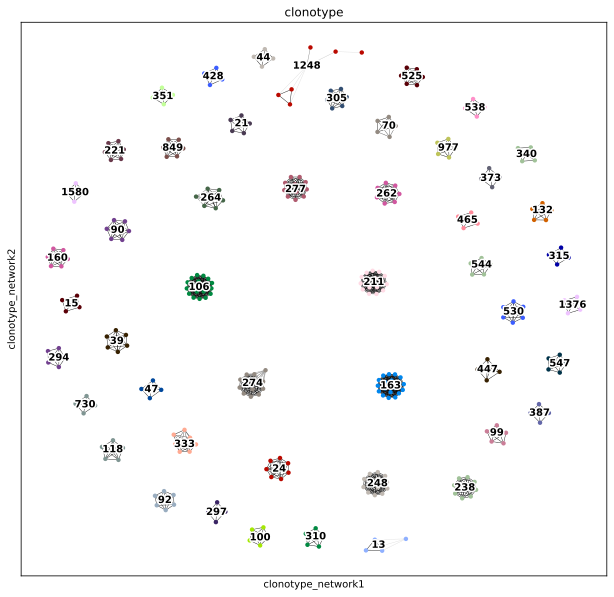

In [21]:
ir.pl.clonotype_network(adata, color="clonotype", legend_fontoutline=3, size=80)

Now we show the same graph, colored by patient.
We observe that for instance clonotypes 277 and 211 (center) are _private_, i.e. they contain cells from
a single sample only. On the other hand, for instance clonotype 333 (bottom left) is _public_, i.e.
it is shared across patients _Lung3_ and _Lung1_. 

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f110a338990>],
      dtype=object)

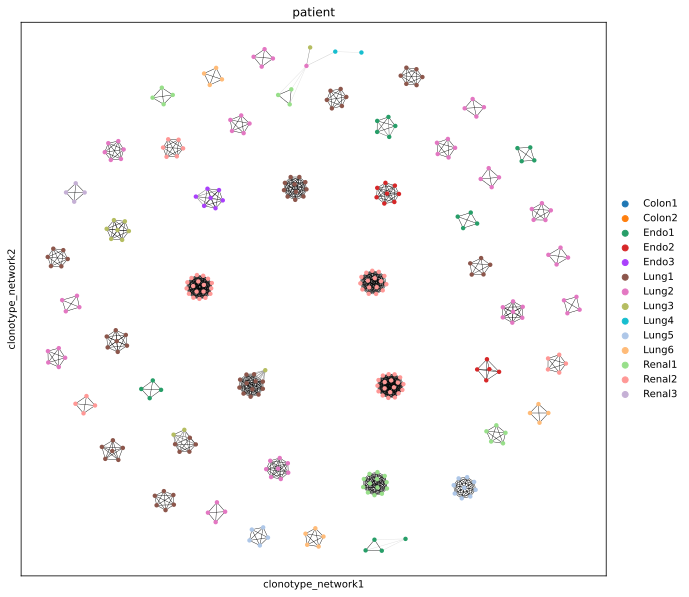

In [22]:
ir.pl.clonotype_network(adata, color="patient", size=80)

We can now extract information (e.g. CDR3-sequences) from a specific clonotype by subsetting `AnnData`. 
Clonotype `333` does not have a detected alpha chain. 

In [23]:
adata.obs.loc[adata.obs["clonotype"] == "333", ["TRA_1_cdr3", "TRA_2_cdr3", "TRB_1_cdr3", "TRB_2_cdr3"]]

,TRA_1_cdr3,TRA_2_cdr3,TRB_1_cdr3,TRB_2_cdr3
LN1_CAGAATCGTCGCATCG-1-19,None,None,CASSYQGATEAFF,None
LN1_TCAATCTGTGTGAAAT-1-19,None,None,CASSYQGATEAFF,None
LN3_TTAGGACGTAAGAGAG-1-11,None,None,CASSYQGSTEAFF,None
LN3_GTCTCGTTCGTACGGC-1-11,None,None,CASSYQGSTEAFF,None
LN1_TGCGTGGCAGCAGTTT-1-19,None,None,CASSYQGATEAFF,None
LN1_GCCTCTATCACTTATC-1-19,None,None,CASSYQGATEAFF,None
LN1_GGACATTTCGTAGGTT-1-19,None,None,CASSYQGATEAFF,None


## Clonotype analysis

### Clonal expansion

In [24]:
ir.tl.clonal_expansion(adata)

`clonal_expansion` refers to expansion categories, i.e singleton clonotypes, clonotypes with 2 cells and more than 2 cells. 
The `clonotype_size` refers to the absolute number of cells in a clonotype. 

... storing 'clonal_expansion' as categorical


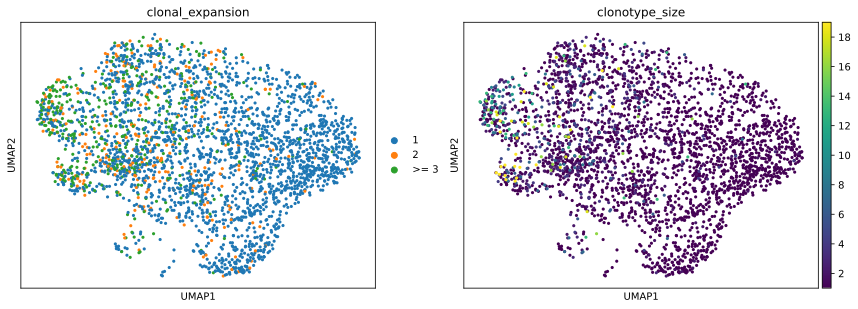

In [25]:
sc.pl.umap(adata, color=["clonal_expansion", "clonotype_size"])

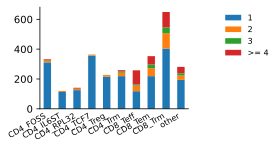

In [26]:
ir.pl.clonal_expansion(adata, groupby="cluster", clip_at=4, normalize=False)

The same plot, normalized to cluster size. Clonal expansion is a sign of positive selection
for a certain, reactive T-cell clone. It, therefore, makes sense that CD8+ effector T-cells 
have the largest fraction of expanded clonotypes. 

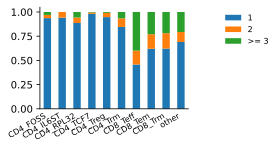

In [27]:
ir.pl.clonal_expansion(adata, "cluster")

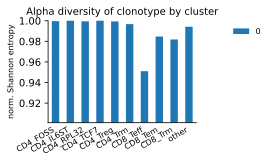

In [28]:
ax = ir.pl.alpha_diversity(adata, groupby="cluster")

### Clonotype abundance

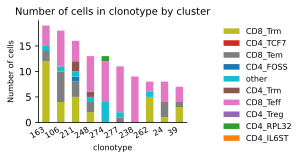

In [29]:
ir.pl.group_abundance(
    adata, groupby="clonotype", target_col="cluster", max_cols=10
)

It might be beneficial to normalize the counts
to the number of cells per sample to mitigate biases due to different sample sizes: 

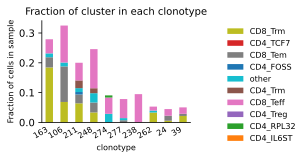

In [30]:
ir.pl.group_abundance(
    adata, groupby="clonotype", target_col="cluster", max_cols=10, fraction="sample"
)

Coloring the bars by patient gives us information about public and private clonotypes: 
Some clonotypes are *private*, i.e. specific to a certain tissue, 
others are *public*, i.e. they are shared across different tissues. 

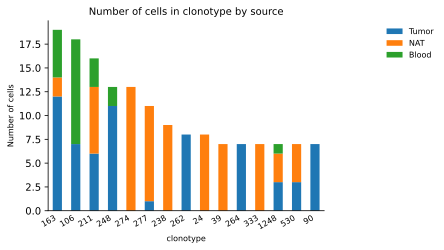

In [31]:
ax = ir.pl.group_abundance(
    adata, groupby="clonotype", target_col="source", max_cols=15, fig_kws={"dpi": 100}
)

However, clonotypes that are shared between *patients* are rare: 

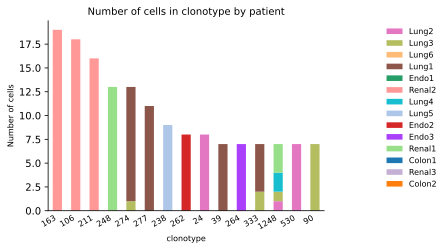

In [32]:
ax = ir.pl.group_abundance(
    adata, groupby="clonotype", target_col="patient", max_cols=15, fig_kws={"dpi": 100}
)

## Gene usage

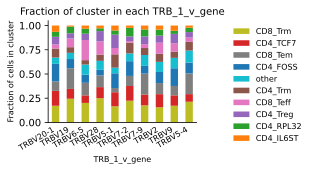

In [33]:
ir.pl.group_abundance(
    adata,
    groupby="TRB_1_v_gene",
    target_col="cluster",
    fraction=True,
    max_cols=10
)

We can pre-select groups by filtering `adata`:

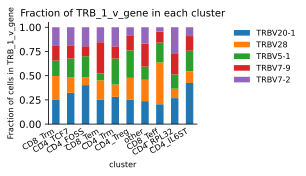

In [34]:
ir.pl.group_abundance(
    adata[adata.obs["TRB_1_v_gene"].isin(
        ["TRBV20-1", "TRBV7-2", "TRBV28", "TRBV5-1", "TRBV7-9"]
    ),:],
    groupby="cluster",
    target_col="TRB_1_v_gene",
    fraction=True,
)

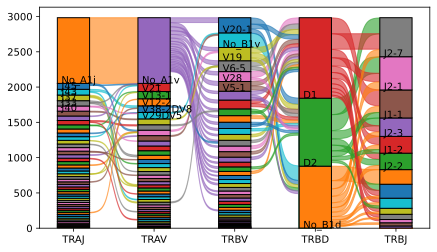

In [35]:
ir.pl.vdj_usage(adata, full_combination=False, top_n=30)

We can also use this plot to investigate the exact VDJ composition of one (or several) clonotypes: 

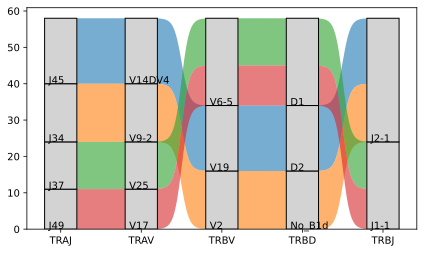

In [36]:
ir.pl.vdj_usage(adata[adata.obs["clonotype"].isin(["274", "277", "211", "106"]), :], top_n=None)

### Spectratype plots

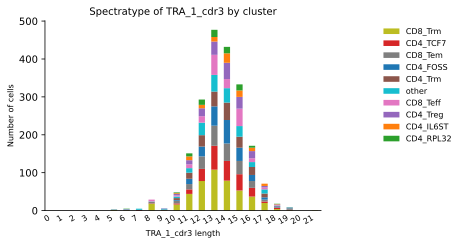

In [37]:
ir.pl.spectratype(adata, target_col="cluster", viztype="bar", fig_kws={"dpi": 120})

The same chart visualized as "ridge"-plot: 

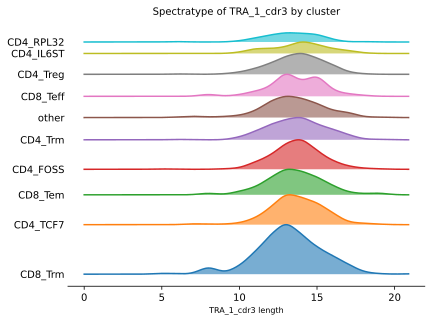

In [38]:
ir.pl.spectratype(
    adata,
    target_col="cluster",
    viztype="curve",
    fig_kws={"dpi": 120},
    kde_kws={'curve_layout': 'shifted', 'kde_norm': False, 'kde_norm': False}
)

A spectratype-plot by gene usage. To pre-select specific genes, we can simply filter the `adata` object before plotting. 

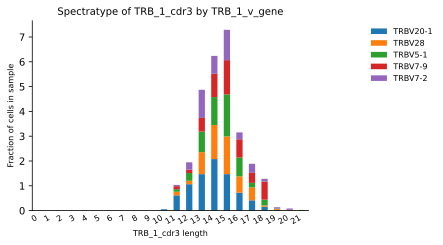

In [39]:
ir.pl.spectratype(
    adata[adata.obs["TRB_1_v_gene"].isin(["TRBV20-1", "TRBV7-2", "TRBV28", "TRBV5-1", "TRBV7-9"]),:], 
    groupby="TRB_1_cdr3",
    target_col="TRB_1_v_gene",
    fraction="sample",
    fig_kws={'dpi': 120}
)

## Experimental plots

### Repertoire overlaps

In [40]:
df, dst, lk = ir.tl.repertoire_overlap(adata, 'sample', inplace=False)

In [41]:
df.head()

clonotype,0,1,2,3,4,5,6,7,8,9,...,2491,2492,2493,2494,2495,2496,2497,2498,2499,2500
sample,,,,,,,,,,,,,,,,,,,,,
CN1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
CN2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CT1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CT2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
EN1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


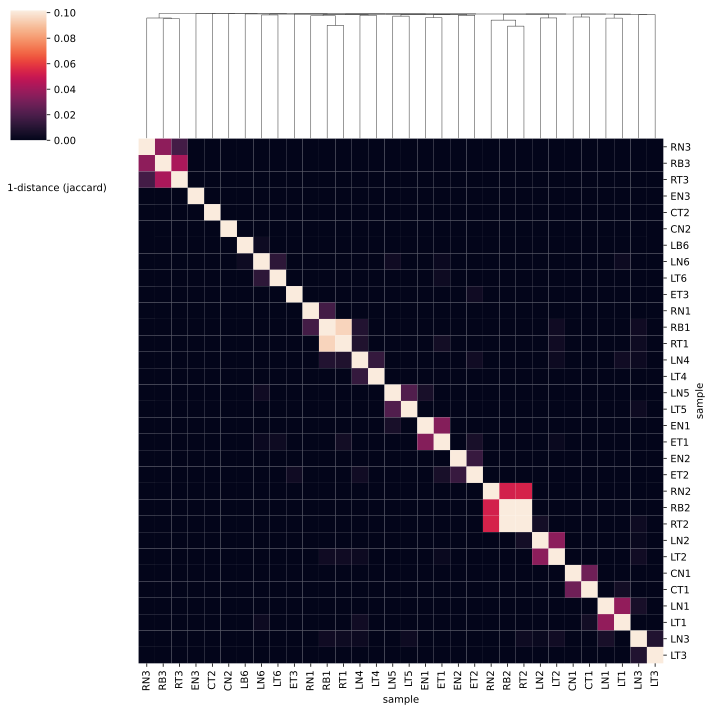

In [42]:
ir.pl.repertoire_overlap(adata, 'sample')

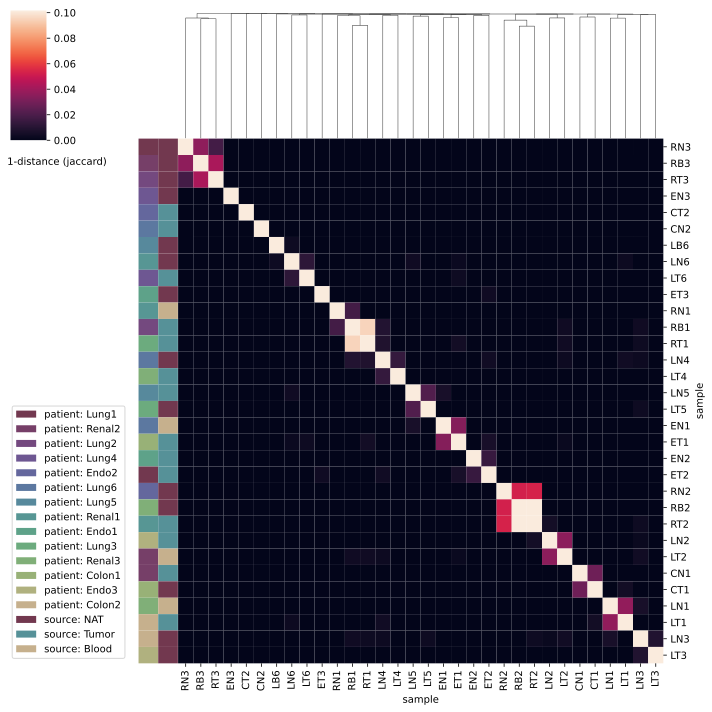

In [43]:
ir.pl.repertoire_overlap(adata, 'sample', heatmap_cats=['patient', 'source'])

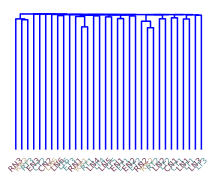

In [44]:
ir.pl.repertoire_overlap(adata, 'sample', dendro_only=True, heatmap_cats=['source'])

No handles with labels found to put in legend.


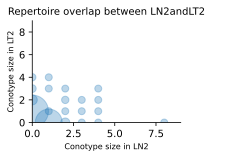

In [45]:
ir.pl.repertoire_overlap(adata, 'sample', pair_to_plot=['LN2', 'LT2'])

In [46]:
# Create a column in obs that gives us the site of the tumor

adata.obs['site'] = adata.obs['patient'].str.slice(stop=-1)

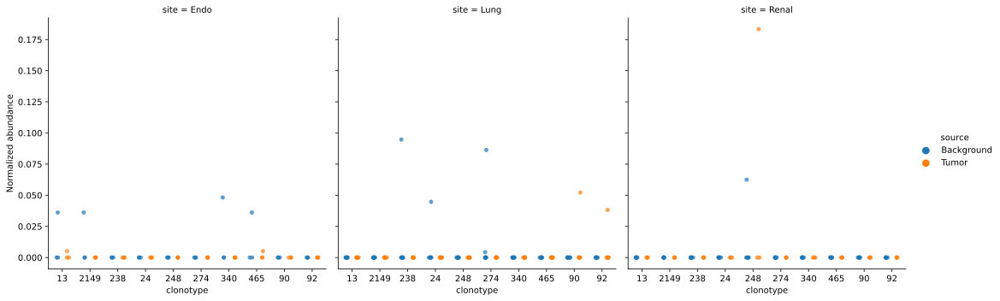

In [47]:
# Show clonotypes that are the most imbalance between Tumor and Control samples based on Fischer's test

ir.pl.clonotype_imbalance(adata, replicate_col='sample', groupby='source', case_label='Tumor', additional_hue='site', plot_type='strip')

No handles with labels found to put in legend.


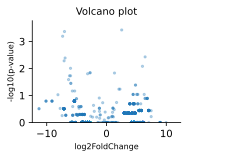

In [48]:
# Plot a Volcano diagram of p-values and the fold difference between the two groups

ir.pl.clonotype_imbalance(adata, replicate_col='sample', groupby='source', case_label='Tumor', additional_hue='diagnosis', plot_type='volcano')